In [0]:
import collections
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
from IPython.display import Image, display

from keras.preprocessing import sequence
from keras.models import Sequential, load_model
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization, CuDNNLSTM
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.preprocessing.image import load_img, img_to_array
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.utils import plot_model

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
img_dir = "/content/drive/My Drive/ML-data/img2text/data/Flicker8k_Dataset/"
caption_file = "/content/drive/My Drive/ML-data/img2text/data/Flickr8k_text/Flickr8k.token.txt"

## Step 1: Take a look at the input data

### 1.1 Build a Image to Caption Map

In [0]:
img_captions = pd.read_csv(caption_file, header=None, delimiter="\t")

img2captions = collections.defaultdict(list)

for img_name, caption in zip(img_captions[0], img_captions[1]):
    img = img_name.split("#")[0]
    img2captions[img].append(caption)

### 1.2 Show image with it's 5 captions

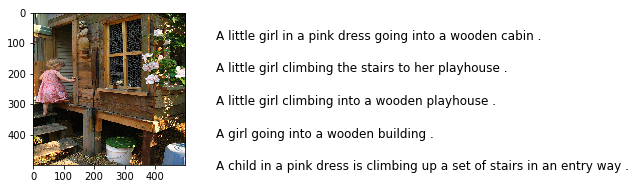

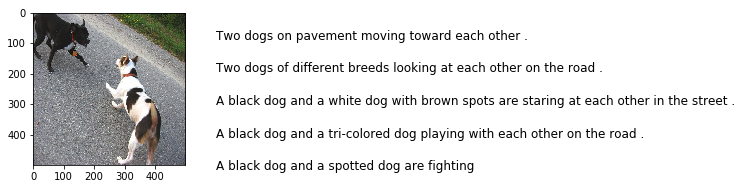

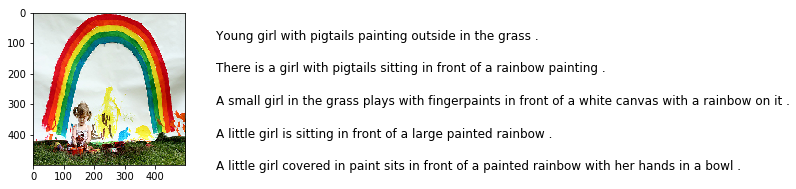

In [5]:
def display_img_with_caption(img):
    fig = plt.figure(figsize = (6, 3))
    
    img_file = img_dir + img
    img_load = load_img(img_file, target_size=(500, 500))
    ax = fig.add_subplot(121)
    ax.imshow(img_load)
    
    captions = img2captions[img]
    ax = fig.add_subplot(122)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0, 1)
    ax.set_ylim(0, len(captions))
    for i, caption in enumerate(captions):
        ax.text(0, i, caption, fontsize=12) 
    plt.show()
    
for img in list(img2captions.keys())[0:3]:
    display_img_with_caption(img)

## Step 2: Process Image Input using InceptionV3

### 2.1: Load pretrained InceptionV3 from keras and drop the last layer

In [6]:
# Get the InceptionV3 model trained on imagenet data
model = InceptionV3(weights='imagenet')
# Remove the last layer (output softmax layer) from the inception v3
encoder_model = Model(model.input, model.layers[-2].output)














96116736/96112376 [==============================] - 7s 0us/step


### 2.2 create encoder function

In [0]:
def encode(img_file):
    img = image.load_img(img_file, target_size=(299, 299))
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    vec = encoder_model.predict(x)
    vec = np.reshape(vec, vec.shape[1])
    return vec

assert(encode(img_dir + "1000268201_693b08cb0e.jpg").shape == (2048, ))

### 2.3 : Load train, dev and test image names(ids)

In [8]:
train_imgs = pd.read_csv("/content/drive/My Drive/ML-data/img2text/data/Flickr8k_text/Flickr_8k.trainImages.txt", header=None)
train_imgs = list(train_imgs[0])

dev_imgs = pd.read_csv("/content/drive/My Drive/ML-data/img2text/data/Flickr8k_text/Flickr_8k.devImages.txt", header=None)
dev_imgs = list(dev_imgs[0])

test_imgs = pd.read_csv("/content/drive/My Drive/ML-data/img2text/data/Flickr8k_text/Flickr_8k.testImages.txt", header=None)
test_imgs = list(test_imgs[0])

print("There are {} train images.".format(len(train_imgs)))
print("There are {} dev images.".format(len(dev_imgs)))
print("There are {} test images.".format(len(test_imgs)))
print("Example image id : {}".format(train_imgs[0]))

There are 6000 train images.
There are 1000 dev images.
There are 1000 test images.
Example image id : 2513260012_03d33305cf.jpg


### 2.4 Load img vector for training set

In [9]:
import os
if not os.path.isfile("/content/drive/My Drive/ML-data/img2text/img2vec_train_8k.pkl"):
    img2vec_train = {}

    for i, img in enumerate(train_imgs):
        if i % 100 == 0:
            print("finish encoding {} images".format(i))
        img2vec_train[img] = encode(img_dir + img)

    print(len(img2vec_train))
    
    f = open('/content/drive/My Drive/ML-data/img2text/img2vec_train_8k.pkl', 'wb')
    pickle.dump(img2vec_train, f)
    f.close()
    print("Saved img2vec_train.")
else:
    f = open('/content/drive/My Drive/ML-data/img2text/img2vec_train_8k.pkl','rb')
    print("img2vec_train_8k.pkl exist. Load it ...")
    img2vec_train = pickle.load(f)
    print("img2vec_train has length of {}".format(len(img2vec_train)))

img2vec_train_8k.pkl exist. Load it ...
img2vec_train has length of 6000


### 2.5: Load image vector for dev set

In [10]:
import os
if not os.path.isfile("/content/drive/My Drive/ML-data/img2text/img2vec_dev_8k.pkl"):
    img2vec_dev = {}

    for i, img in enumerate(dev_imgs):
        if i % 100 == 0:
            print("finish encoding {} images".format(i))
        img2vec_dev[img] = encode(img_dir + img)

    print(len(img2vec_dev))
    
    f = open('/content/drive/My Drive/ML-data/img2text/img2vec_dev_8k.pkl', 'wb')
    pickle.dump(img2vec_dev, f)
    f.close()
    print("Saved img2vec_dev.")
else:
    f = open('/content/drive/My Drive/ML-data/img2text/img2vec_dev_8k.pkl','rb')
    print("img2vec_dev_8k.pkl exist. Load it ...")
    img2vec_dev = pickle.load(f)
    print("img2vec_dev has length of {}".format(len(img2vec_dev)))

img2vec_dev_8k.pkl exist. Load it ...
img2vec_dev has length of 1000


### 2.5 Load image vector for test set

In [11]:
import os
if not os.path.isfile("/content/drive/My Drive/ML-data/img2text/img2vec_test_8k.pkl"):
    
    img2vec_test = {}

    for i, img in enumerate(test_imgs):
        if i % 100 == 0:
            print("finish encoding {} images".format(i))
        img2vec_test[img] = encode(img_dir + img)

    print(len(img2vec_test))
    
    f = open('/content/drive/My Drive/ML-data/img2text/img2vec_test_8k.pkl', 'wb')
    pickle.dump(img2vec_test, f)          # dump data to f
    f.close()
    print("Saved img2vec_test.")
else:
    f = open('/content/drive/My Drive/ML-data/img2text/img2vec_test_8k.pkl','rb')
    print("img2vec_test_8k.pkl exist. Load it ...")
    img2vec_test = pickle.load(f)
    print("img2vec_test has length of {}".format(len(img2vec_test)))

img2vec_test_8k.pkl exist. Load it ...
img2vec_test has length of 1000


## Step 3: Process Caption (text) Input

### 3.1: Add start and end sequence tokens

In [12]:
for img, captions in img2captions.items():
    img2captions[img] = ['startseq ' + text + ' endseq' for text in captions]
    
img2captions["1000268201_693b08cb0e.jpg"]

['startseq A child in a pink dress is climbing up a set of stairs in an entry way . endseq',
 'startseq A girl going into a wooden building . endseq',
 'startseq A little girl climbing into a wooden playhouse . endseq',
 'startseq A little girl climbing the stairs to her playhouse . endseq',
 'startseq A little girl in a pink dress going into a wooden cabin . endseq']

### 3.2: Clean up Captions

In [13]:
import string
table = str.maketrans(dict.fromkeys(string.punctuation))

for img_id, captions in img2captions.items():
    for i in range(len(captions)):
        caption = captions[i]
        
        words = caption.split()
        words = [word.lower() for word in words]
        # Remove punctuation
        words = [word.translate(table) for word in words]
        # Remove single character word
        words = [word for word in words if len(word) > 1]
        # Remove words that contain numeric values
        words = [word for word in words if word.isalpha()]
        
        cleaned_caption = " ".join(words)
        img2captions[img_id][i] = cleaned_caption

list(img2captions.values())[:1]

[['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
  'startseq girl going into wooden building endseq',
  'startseq little girl climbing into wooden playhouse endseq',
  'startseq little girl climbing the stairs to her playhouse endseq',
  'startseq little girl in pink dress going into wooden cabin endseq']]

### 3.3: Load train and test image captions

In [14]:
img2captions_train = {}
for img in train_imgs:
    img2captions_train[img] = img2captions[img]


img2captions_dev = {}
for img in dev_imgs:
    img2captions_dev[img] = img2captions[img]
    
    
img2captions_test = {}
for img in test_imgs:
    img2captions_test[img] = img2captions[img]

print("There are {} train images with captions.".format(len(img2captions_train)))
print("There are {} dev images with captions.".format(len(img2captions_dev)))
print("There are {} test images with captions.".format(len(img2captions_test)))

There are 6000 train images with captions.
There are 1000 dev images with captions.
There are 1000 test images with captions.


### 3.4 Generate Vocab based on word frequency

In [15]:
original_vocab = set()

for img_id, captions in img2captions_train.items():
    for caption in captions:
        tokens = caption.split()
        original_vocab = original_vocab | set(tokens)
        
print("Orignal vocab size is {}".format(len(original_vocab)))
vocab = original_vocab

Orignal vocab size is 7578


In [16]:
frequency_threshold = 10

all_words = []

for img_id, captions in img2captions_train.items():
    for caption in captions:
        tokens = caption.split()
        all_words += tokens
        
word_freq = collections.Counter(all_words)

vocab = set()

for word, freq in word_freq.items():
    if freq >= frequency_threshold:
        vocab.add(word)
    # else:
        # print(word)
        
print("Filtered vocab size is {}".format(len(vocab)))

Filtered vocab size is 1651


### 3.5: Get caption max length

In [17]:
max_length = 0

for _, captions in img2captions.items():
    max_length = max(max_length, max([len(text.split()) for text in captions]))

print("Max length of a captions is {} (including startseq and endseq)".format(max_length))


Max length of a captions is 34 (including startseq and endseq)


### 3.6: Setup Glove Embedding

In [18]:
word2idx = {}
idx2word = {}

idx = 1
for word in vocab:
    word2idx[word] = idx
    idx2word[idx] = word
    idx += 1
    
vocab_size = len(vocab) + 1 # add one more vocab for zero padding
print("The vocab size with padding is {}".format(vocab_size))

The vocab size with padding is 1652


In [19]:
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models.keyedvectors import KeyedVectors

word_vectors = KeyedVectors.load_word2vec_format("/content/drive/My Drive/ML-data/img2text/gensim_glove_vectors.txt", binary=False)
word_vectors

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [20]:
embedding_dim = 300

embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, idx in word2idx.items():
    if word in word_vectors:
        vec = word_vectors[word]
        embedding_matrix[idx] = vec
    
print("embedding_matrix has size {}".format(embedding_matrix.shape))

embedding_matrix has size (1652, 300)


## Step 4: Generate model input and output

In [0]:
import gc

def data_generator(img2vec, img2captions):
    data_size = 0
    
    for img, _ in img2vec.items():
        for caption in img2captions[img]:
            count = sum([1 for word in caption.split() if word in word2idx])
            data_size += count - 1

    Xtext = np.zeros((data_size, max_length))
    Ximg = np.zeros((data_size, 2048))
    ytext = np.zeros((data_size, 1))            

    index = 0
    
    for img, img_vec in img2vec.items():
        for caption in img2captions[img]:
            seq = [word2idx[word] for word in caption.split() if word in word2idx]
            
            for i in range(1, len(seq)):
                in_seq, out_seq = seq[:i], seq[i]
                # pad in the input sequence
                in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                
                Xtext[index] = in_seq
                Ximg[index] = img_vec
                ytext[index] = out_seq

                index += 1
                
    return Xtext, Ximg, ytext

In [22]:
Xtext_train, Ximg_train, ytext_train = data_generator(img2vec_train, img2captions)
Xtext_dev, Ximg_dev, ytext_dev = data_generator(img2vec_dev, img2captions)
Xtext_test, Ximg_test, ytext_test = data_generator(img2vec_test, img2captions)

print("Xtext_train: {}, Ximg_train: {}, ytext_train: {}".format(Xtext_train.shape, Ximg_train.shape, ytext_train.shape))
print("Xtext_dev: {}, Ximg_dev: {}, ytext_dev: {}".format(Xtext_dev.shape, Ximg_dev.shape, ytext_dev.shape))
print("Xtext_test: {}, Xtext_test: {}, ytext_test: {}".format(Xtext_test.shape, Ximg_test.shape, ytext_test.shape))

Xtext_train: (292328, 34), Ximg_train: (292328, 2048), ytext_train: (292328, 1)
Xtext_dev: (48891, 34), Ximg_dev: (48891, 2048), ytext_dev: (48891, 1)
Xtext_test: (48766, 34), Xtext_test: (48766, 2048), ytext_test: (48766, 1)


## Step 5: Define Model Architecture (Using Merge Model)

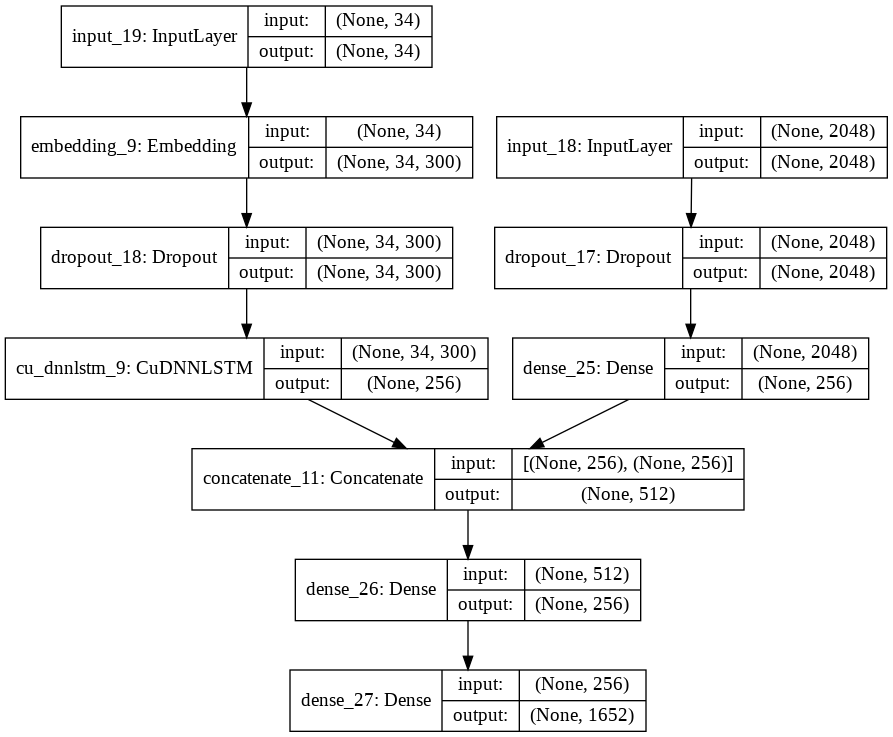

In [154]:
def generate_model(dropout_rate = 0.5, 
                   lstm_unit = 256, 
                   dense_unit = 256, 
                   embedding_trainable = False):
    
    input_image = Input(shape=(Ximg_train.shape[1],))
    fimage = Dropout(dropout_rate)(input_image)
    fimage = Dense(dense_unit, activation="relu")(fimage)

    input_txt = Input(shape=(max_length,))
    ftxt = Embedding(vocab_size, 
                     embedding_dim, 
                     weights=[embedding_matrix], 
                     trainable=embedding_trainable)(input_txt)
    ftxt = Dropout(dropout_rate)(ftxt)
    ftxt = CuDNNLSTM(lstm_unit)(ftxt)

    decoder = concatenate([fimage, ftxt])
    decoder = Dense(dense_unit, activation='relu')(decoder)
    outputs = Dense(vocab_size, activation='softmax')(decoder)
    model = Model(inputs=[input_image, input_txt], outputs=outputs)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    return model

### Test out the model
model = generate_model(dropout_rate=0.5, embedding_trainable=True)
plot_model(model, show_shapes=True)

## Step 6: Fit the model to the training set

### 6.1: Define Callbacks (includes early stopping and checkpoints)

In [0]:
# Define callback 
early_stopping = EarlyStopping(monitor='val_loss', mode='min', min_delta=0.01, verbose=1, patience=10)
checkpoint = ModelCheckpoint('/content/drive/My Drive/ML-data/img2text/best_model_with_glove.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)


callbacks = [early_stopping, checkpoint]

### 6.2: Train the model and save the best model

In [157]:
import time 
start = time.time()

hist = model.fit(
    [Ximg_train, Xtext_train], 
    ytext_train, 
    epochs=20, 
    verbose=2, 
    batch_size=2048,
    validation_data=[[Ximg_dev, Xtext_dev], ytext_dev],
    callbacks=callbacks
)

end = time.time()
print("TIME TOOK {:3.2f}MIN".format((end - start )/60))

Train on 292328 samples, validate on 48891 samples
Epoch 1/20
 - 18s - loss: 4.6425 - acc: 0.1992 - val_loss: 3.8114 - val_acc: 0.2681

Epoch 00001: val_loss improved from inf to 3.81145, saving model to /content/drive/My Drive/ML-data/img2text/best_model_with_glove.h5
Epoch 2/20
 - 14s - loss: 3.5779 - acc: 0.2860 - val_loss: 3.4180 - val_acc: 0.3061

Epoch 00002: val_loss improved from 3.81145 to 3.41804, saving model to /content/drive/My Drive/ML-data/img2text/best_model_with_glove.h5
Epoch 3/20
 - 14s - loss: 3.2687 - acc: 0.3147 - val_loss: 3.2701 - val_acc: 0.3216

Epoch 00003: val_loss improved from 3.41804 to 3.27013, saving model to /content/drive/My Drive/ML-data/img2text/best_model_with_glove.h5
Epoch 4/20
 - 14s - loss: 3.0978 - acc: 0.3317 - val_loss: 3.1856 - val_acc: 0.3301

Epoch 00004: val_loss improved from 3.27013 to 3.18560, saving model to /content/drive/My Drive/ML-data/img2text/best_model_with_glove.h5
Epoch 5/20
 - 14s - loss: 2.9760 - acc: 0.3451 - val_loss: 3.

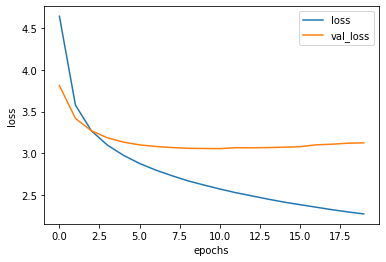

In [158]:
for label in ["loss","val_loss"]:
    plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

### 6.3: Load the best model

In [0]:
# load the saved model
model = load_model('/content/drive/My Drive/ML-data/img2text/best_model_with_glove.h5')
# evaluate the model
# _, train_acc = model.evaluate([Ximg_train, Xtext_train], ytext_train, verbose=0)
# _, test_acc = model.evaluate([Ximg_test, Xtext_test], ytext_test, verbose=0)
# print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

## Step 7: Define Inference Method (Greedy search and Beam search)

### 7.1: Greedy Search

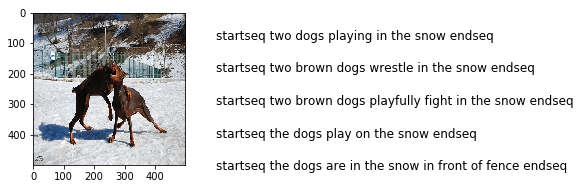

Greedy search result: startseq brown dog is running through the snow endseq


In [160]:
def greedy_search(img_vec):
    input_words = ['startseq']
    
    for Ty in range(2, max_length + 1):
        input_word_ids = [word2idx[word] for word in input_words if word in word2idx]
        input_word_ids = pad_sequences([input_word_ids], maxlen=max_length)
        
        yhat = model.predict([img_vec.reshape((1,2048)), input_word_ids], verbose=0)
        predicted_word = idx2word[np.argmax(yhat)]
        input_words.append(predicted_word)

        if predicted_word == 'endseq':
            break
            
    # Remove startseq and endseq token
    # result = input_words[1:-1]
    result = input_words
    return " ".join(result)

# Test
img = test_imgs[0]
display_img_with_caption(img)
img_vec = img2vec_test[img]

print("Greedy search result: {}".format(greedy_search(img_vec)))

### 7.2 Beam Search with Length Normalization

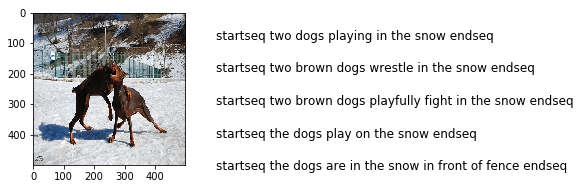

Beam search with beam width = 1: ['startseq brown dog is running through the snow endseq']
Beam search with beam width = 2: ['startseq the brown dog is running through the snow endseq', 'startseq brown dog is running through the snow endseq', 'startseq brown dog with red collar is running through the snow endseq', 'startseq the brown dog is running on the sand endseq', 'startseq brown dog with red collar is running on the sand endseq']


In [161]:
from collections import namedtuple

Candidate = namedtuple('Candidate', ['words', 'score'])

def beam_search(img_vec, width = 3):
    img_vec = img_vec.reshape((1,2048))
    input_candidates = [Candidate(words = ['startseq'], score = 0.0)] # log score = log(1) = 0
    
    for Ty in range(2, max_length + 1):
        ouput_candidates = []

        for i in range(len(input_candidates)):
            input_candidate = input_candidates[i]
            input_words, input_score = input_candidate

            if input_words[-1] == "endseq":
                ouput_candidates.append(input_candidate)
                continue
            
            input_word_ids = [word2idx[word] for word in input_words if word in word2idx]
            input_word_ids = pad_sequences([input_word_ids], maxlen=max_length)
            
            yhat = model.predict([img_vec, input_word_ids], verbose=0)
            for idx in range(1, yhat.shape[1]):
                predicted_word = idx2word[idx]
                prob = yhat[0][idx]
                output_words = input_words + [predicted_word]
                output_score = input_score + np.log(prob) # Log probability avoiding numberic underflow
                output_candidate = Candidate(output_words, output_score)
                ouput_candidates.append(output_candidate)
                
                
        ordered = sorted(
            ouput_candidates, 
            key=lambda candidate: candidate.score / len(candidate.words), # Length Normalization
            # key=lambda candidate: candidate.score, # Length Normalization
            reverse=True
        )
        
        input_candidates = ordered[:width]   
            
    # return [" ".join(input_candidate.words[1:-1]) for input_candidate in input_candidates]
    return [" ".join(input_candidate.words) for input_candidate in input_candidates]

# Test
img = test_imgs[0]
display_img_with_caption(img)
img_vec = img2vec_test[img]

print("Beam search with beam width = 1: {}".format(beam_search(img_vec, width = 1)))
assert(beam_search(img_vec, width = 1)[0] == greedy_search(img_vec))
print("Beam search with beam width = 2: {}".format(beam_search(img_vec, width = 5)))

## Step 8: Define Evaluation Metrics (CIDEr, Bleu) and evaluate the model

### Train Set Result

In [79]:
img2captions_train_prediction_greedy = {}

i = 0
for img in train_imgs:
    if i % 1000 == 0:
        print("Finish inferencing for {} train images".format(i))
    i += 1
    img_vec = img2vec_train[img]
    prediction = greedy_search(img_vec)
    img2captions_train_prediction_greedy[img] = prediction

Finish inferencing for 0 train images
Finish inferencing for 1000 train images
Finish inferencing for 2000 train images
Finish inferencing for 3000 train images
Finish inferencing for 4000 train images
Finish inferencing for 5000 train images


### Dev Set Caption result

In [80]:
img2captions_dev_prediction_greedy = {}

i = 0
for img in dev_imgs:
    if i % 100 == 0:
        print("Finish inferencing for {} train images".format(i))
    i += 1
    img_vec = img2vec_dev[img]
    prediction = greedy_search(img_vec)
    img2captions_dev_prediction_greedy[img] = prediction

Finish inferencing for 0 train images
Finish inferencing for 100 train images
Finish inferencing for 200 train images
Finish inferencing for 300 train images
Finish inferencing for 400 train images
Finish inferencing for 500 train images
Finish inferencing for 600 train images
Finish inferencing for 700 train images
Finish inferencing for 800 train images
Finish inferencing for 900 train images


In [81]:
img2captions_dev_prediction_beam = {}

i = 0
for img in dev_imgs:
    if i % 100 == 0:
        print("Finish inferencing for {} dev images".format(i))
    i += 1
    img_vec = img2vec_dev[img]
    prediction = beam_search(img_vec, width=3)[0]
    img2captions_dev_prediction_beam[img] = prediction

Finish inferencing for 0 dev images
Finish inferencing for 100 dev images
Finish inferencing for 200 dev images
Finish inferencing for 300 dev images
Finish inferencing for 400 dev images
Finish inferencing for 500 dev images
Finish inferencing for 600 dev images
Finish inferencing for 700 dev images
Finish inferencing for 800 dev images
Finish inferencing for 900 dev images


### Test Set Caption result

In [82]:
img2captions_test_prediction_greedy = {}

i = 0
for img in test_imgs:
    if i % 100 == 0:
        print("Finish inferencing for {} test images".format(i))
    i += 1
    img_vec = img2vec_test[img]
    prediction = greedy_search(img_vec)
    img2captions_test_prediction_greedy[img] = prediction

Finish inferencing for 0 test images
Finish inferencing for 100 test images
Finish inferencing for 200 test images
Finish inferencing for 300 test images
Finish inferencing for 400 test images
Finish inferencing for 500 test images
Finish inferencing for 600 test images
Finish inferencing for 700 test images
Finish inferencing for 800 test images
Finish inferencing for 900 test images


In [83]:
img2captions_test_prediction_beam = {}

i = 0
for img in test_imgs:
    if i % 100 == 0:
        print("Finish inferencing for {} test images".format(i))
    i += 1
    img_vec = img2vec_test[img]
    prediction = beam_search(img_vec, width=3)[0]
    img2captions_test_prediction_beam[img] = prediction

Finish inferencing for 0 test images
Finish inferencing for 100 test images
Finish inferencing for 200 test images
Finish inferencing for 300 test images
Finish inferencing for 400 test images
Finish inferencing for 500 test images
Finish inferencing for 600 test images
Finish inferencing for 700 test images
Finish inferencing for 800 test images
Finish inferencing for 900 test images


In [84]:
! pip install git+https://github.com/salaniz/pycocoevalcap

  Cloning https://github.com/salaniz/pycocoevalcap to /tmp/pip-req-build-x47u6gr8
  Running command git clone -q https://github.com/salaniz/pycocoevalcap /tmp/pip-req-build-x47u6gr8
  Created wheel for pycocoevalcap: filename=pycocoevalcap-1.0-cp36-none-any.whl size=73561450 sha256=676671e871fe984c7ac049d1b8a974fa57658c7f662854eb53e772e8cdc362b0
  Stored in directory: /tmp/pip-ephem-wheel-cache-5ad76j7h/wheels/2f/61/19/955be15d553de0734697c376a48bc9f52746bdaa50a4905819
Successfully built pycocoevalcap


### 8.1: CIDEr

In [0]:
from pycocoevalcap.cider.cider import Cider

def get_Cider_score(img2captions, img2captions_prediction):
    gts = {}
    res = {}

    for img, captions in img2captions.items():
        gts[img] = [" ".join(caption.split()) for caption in captions]
        res[img] = [img2captions_prediction[img]]

    return Cider().compute_score(gts, res)[0]

#### 8.1.1 Train Score

In [86]:
train_greedy_cider_score = get_Cider_score(img2captions_train, img2captions_train_prediction_greedy)
print("Train set CIDEr score using greedy search is {}".format(train_greedy_cider_score))

# test_beam_cider_score = get_Cider_score(img2captions_test, img2captions_test_prediction_beam)
# print("Test set CIDEr score using beam search is {}".format(test_beam_cider_score))

Train set CIDEr score using greedy search is 0.6539596370384849


#### 8.1.2 Dev Score

In [87]:
dev_greedy_cider_score = get_Cider_score(img2captions_dev, img2captions_dev_prediction_greedy)
print("Dev set CIDEr score using greedy search is {}".format(dev_greedy_cider_score))

dev_beam_cider_score = get_Cider_score(img2captions_dev, img2captions_dev_prediction_beam)
print("Dev set CIDEr score using beam search is {}".format(dev_beam_cider_score))

Dev set CIDEr score using greedy search is 0.43351115937354984
Dev set CIDEr score using beam search is 0.4665990977223178


#### 8.1.3 Test Score

In [88]:
test_greedy_cider_score = get_Cider_score(img2captions_test, img2captions_test_prediction_greedy)
print("Test set CIDEr score using greedy search is {}".format(test_greedy_cider_score))

test_beam_cider_score = get_Cider_score(img2captions_test, img2captions_test_prediction_beam)
print("Test set CIDEr score using beam search is {}".format(test_beam_cider_score))

Test set CIDEr score using greedy search is 0.44643052965402535
Test set CIDEr score using beam search is 0.48076378808084924


### 8.2 Bleu

In [0]:
from pycocoevalcap.bleu.bleu import Bleu

def get_bleu_score(img2captions, img2captions_prediction):
    gts = {}
    res = {}

    for img, captions in img2captions.items():
        gts[img] = [" ".join(caption.split()) for caption in captions]
        res[img] = [img2captions_prediction[img]]

    return Bleu(4).compute_score(gts, res)[0]

#### 8.2.1 Train score

In [90]:
train_greedy_bleu_score = get_bleu_score(img2captions_train, img2captions_train_prediction_greedy)
print("Bleu (Train) (greedy) :{}".format(train_greedy_bleu_score))

# test_beam_bleu_score = get_bleu_score(img2captions_test, img2captions_test_prediction_beam)
# print("Test set Bleu score using beam search is {}".format(test_beam_bleu_score))

{'testlen': 62523, 'reflen': 61801, 'guess': [62523, 56523, 50523, 44523], 'correct': [41292, 17985, 7894, 3011]}
ratio: 1.0116826588566366
Bleu (Train) (greedy) :[0.6604289621419213, 0.4584116794709946, 0.32021360495698975, 0.21707580431310197]


#### 8.2.2 Dev Score

In [93]:
dev_greedy_bleu_score = get_bleu_score(img2captions_dev, img2captions_dev_prediction_greedy)
print("Bleu (Dev) (greedy) :{}".format(dev_greedy_bleu_score))

test_beam_bleu_score = get_bleu_score(img2captions_test, img2captions_test_prediction_beam)
print("Bleu (Dev) (Beam) :{}".format(test_beam_bleu_score))

{'testlen': 10602, 'reflen': 10442, 'guess': [10602, 9602, 8602, 7602], 'correct': [6297, 2235, 867, 290]}
ratio: 1.0153227351081195
Bleu (Dev) (greedy) :[0.5939445387662144, 0.37181838453070193, 0.24063592222902744, 0.1518405883146183]
{'testlen': 10925, 'reflen': 10668, 'guess': [10925, 9925, 8925, 7925], 'correct': [6604, 2544, 1104, 406]}
ratio: 1.0240907386575717
Bleu (Dev) (Beam) :[0.6044851258580682, 0.3936281102604093, 0.26761534965098566, 0.17701699151718275]


#### 8.2.3 Test Score

In [94]:
test_greedy_bleu_score = get_bleu_score(img2captions_test, img2captions_test_prediction_greedy)
print("Bleu (Test) (greedy) :{}".format(test_greedy_bleu_score))

test_beam_bleu_score = get_bleu_score(img2captions_test, img2captions_test_prediction_beam)
print("Bleu (Test) (beam) :{}".format(test_beam_bleu_score))

{'testlen': 10691, 'reflen': 10522, 'guess': [10691, 9691, 8691, 7691], 'correct': [6352, 2280, 888, 294]}
ratio: 1.0160615852498558
Bleu (Test) (greedy) :[0.5941446076138253, 0.37387739377810464, 0.2426240659085443, 0.15285918405968396]
{'testlen': 10925, 'reflen': 10668, 'guess': [10925, 9925, 8925, 7925], 'correct': [6604, 2544, 1104, 406]}
ratio: 1.0240907386575717
Bleu (Test) (beam) :[0.6044851258580682, 0.3936281102604093, 0.26761534965098566, 0.17701699151718275]


## Step 9: Hyperparameter Tuning

### 9.1 Based on Loss (lower the better)

In [0]:
param_dict = {
    "dropout_rates" : [0, 0.5], 
    "layer_sizes": [256, 512],
    "embedding_trainables": [True, False],
    "mini_batch_sizes": [32, 64, 128, 256, 512, 1024, 2048]
}

In [0]:
min_loss = float("inf")
best_param = None

for layer_size in param_dict["layer_sizes"]:
    for embedding_trainable in param_dict["embedding_trainables"]:
        for mini_batch_size in param_dict["mini_batch_sizes"]:
            for dropout_rate in param_dict["dropout_rates"]:
                print("layer_size = {}, embedding_trainable = {}, mini_batch_size = {}, dropout_rate = {}".format(layer_size, embedding_trainable, mini_batch_size, dropout_rate))
                test_model = generate_model(dropout_rate = dropout_rate, 
                                            lstm_unit = layer_size, 
                                            dense_unit = layer_size, 
                                            embedding_trainable = embedding_trainable)
                
                early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.01, verbose=2)
                callbacks_list = [early_stopping]

                hist = test_model.fit(
                    [Ximg_train, Xtext_train], 
                    ytext_train, 
                    epochs=100, 
                    verbose=0, 
                    batch_size=mini_batch_size,
                    validation_data=[[Ximg_dev, Xtext_dev], ytext_dev],
                    callbacks=callbacks_list
                )

                loss = hist.history["loss"][-1]
                val_loss = hist.history["val_loss"][-1]
                print("\tloss = {}, val_loss = {}\n".format(loss, val_loss))

                if loss < min_loss:
                    min_loss = loss
                    best_param = (layer_size, embedding_trainable, mini_batch_size, dropout_rate)
                

print("Best param is {} with lowest loss {}".format(best_param, min_loss))
                

layer_size = 256, embedding_trainable = True, mini_batch_size = 32, dropout_rate = 0
Epoch 00003: early stopping
	loss = 3.2315278351458647, val_loss = 3.804676952035437

layer_size = 256, embedding_trainable = True, mini_batch_size = 32, dropout_rate = 0.5
Epoch 00004: early stopping
	loss = 3.3782221590610004, val_loss = 3.8347637533176266

layer_size = 256, embedding_trainable = True, mini_batch_size = 64, dropout_rate = 0
Epoch 00003: early stopping
	loss = 3.0346193157476966, val_loss = 3.6759750821895154

layer_size = 256, embedding_trainable = True, mini_batch_size = 64, dropout_rate = 0.5
Epoch 00004: early stopping
	loss = 3.1369072770146738, val_loss = 3.688696314329641

layer_size = 256, embedding_trainable = True, mini_batch_size = 128, dropout_rate = 0
Epoch 00003: early stopping
	loss = 2.9360305952905366, val_loss = 3.582146045132732

layer_size = 256, embedding_trainable = True, mini_batch_size = 128, dropout_rate = 0.5
Epoch 00004: early stopping
	loss = 3.011887104669

In [0]:
beam_search_widths = [3]

def inference(img_file):
    img_vec = encode(img_file)
    display(Image(filename=img_file, width=300, height=300))
    # hypo_k_prob = []
    print("\ngreedy_search: {}".format(" ".join(greedy_search(img_vec).split(" ")[1:-1])))
    assert(greedy_search(img_vec) == beam_search(img_vec, 1)[0])
    
    for k in beam_search_widths:
        # print("\nBeam search with width {}:".format(k))
        hypothesis = beam_search(img_vec, k)[:1]
        for hypo in hypothesis:
            print("\nBeam search(width = 3): {}".format(" ".join(hypo.split()[1:-1])))

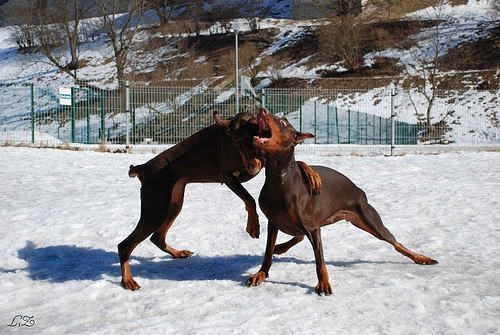


greedy_search: brown dog is running through the snow

Beam search(width = 3): brown dog is running through the snow


In [162]:
img_file = img_dir + test_imgs[0]

inference(img_file)

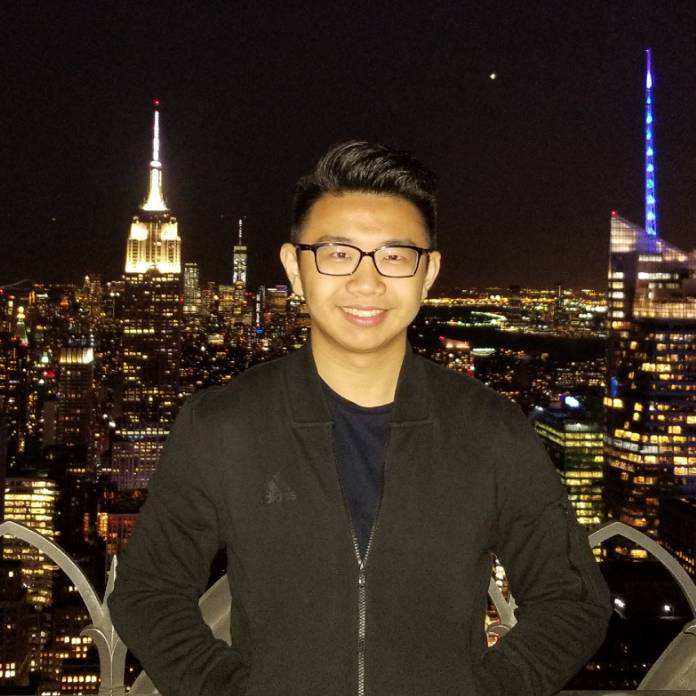


greedy_search: man in black shirt and tie stands in front of restaurant

Beam search(width = 3): man and woman are standing in front of restaurant


In [163]:
img_file = "/content/drive/My Drive/ML-data/img2text/personal_test_image/Profile.jpg"

inference(img_file)

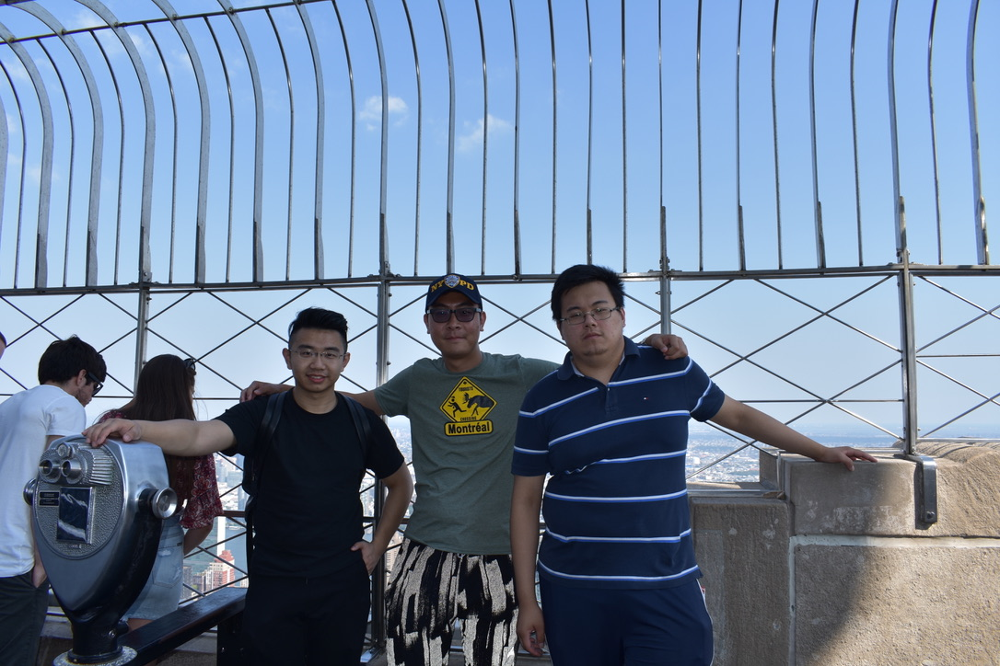


greedy_search: two people are standing on bench with their arms around each other

Beam search(width = 3): group of people are standing in front of fountain


In [164]:
img_file = "/content/drive/My Drive/ML-data/img2text/personal_test_image/IMG_6666.jpg"

inference(img_file)

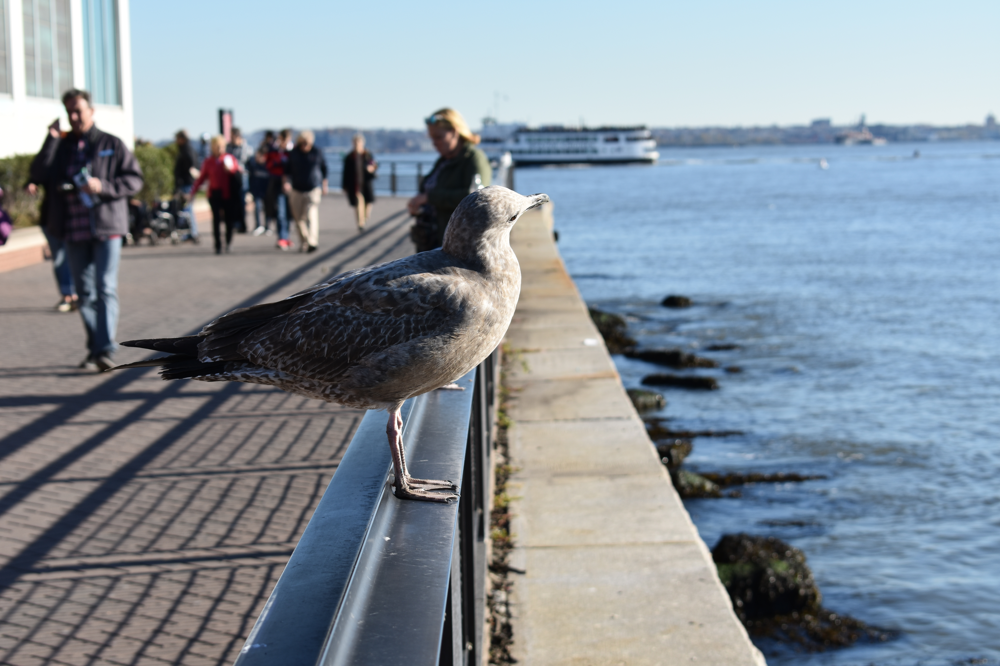


greedy_search: two people sit on dock overlooking the water

Beam search(width = 3): two people sit on dock overlooking the water


In [145]:
img_file = "/content/drive/My Drive/ML-data/img2text/personal_test_image/0AFE403A-7EE3-4BEF-B85B-0B3B79426707.jpeg"

inference(img_file)

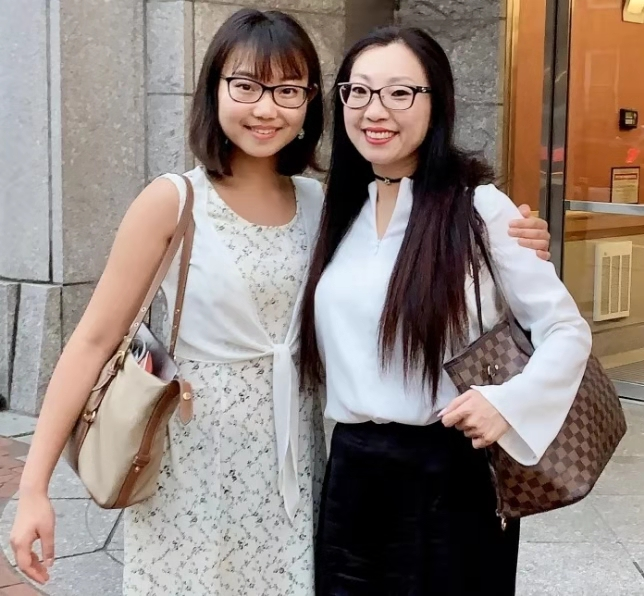


greedy_search: two women in black are standing in front of the wall

Beam search(width = 3): two asian women are posing for picture


In [165]:
img_file = "/content/drive/My Drive/ML-data/img2text/personal_test_image/12711573668962_.pic.jpg"

inference(img_file)

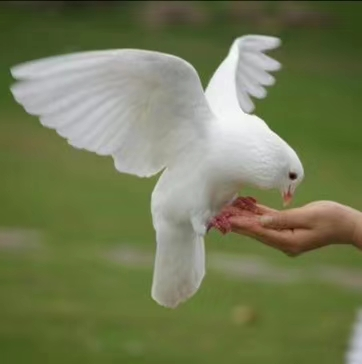


greedy_search: white bird is flying over the grass

Beam search(width = 3): the white bird is flying over the water


In [166]:
img_file = "/content/drive/My Drive/ML-data/img2text/personal_test_image/12721573669049_.pic.jpg"

inference(img_file)

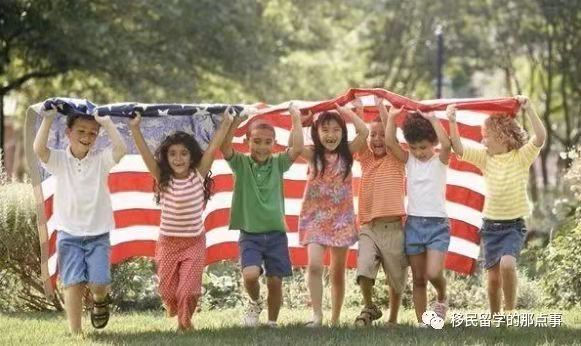


greedy_search: two girls are walking on the grass

Beam search(width = 3): group of children are running on the grass


In [167]:
img_file = "/content/drive/My Drive/ML-data/img2text/personal_test_image/12731573669179_.pic.jpg"

inference(img_file)

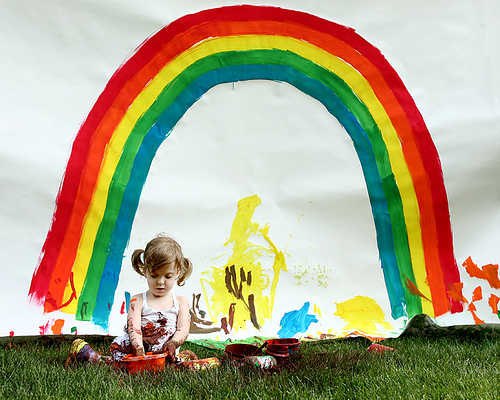


greedy_search: girl in pink shirt is sitting on the lawn with colorful rainbow

Beam search(width = 3): little girl in pink shirt is playing with colorful inflatable balloons


In [168]:
img_file = img_dir + "1002674143_1b742ab4b8.jpg"

inference(img_file)

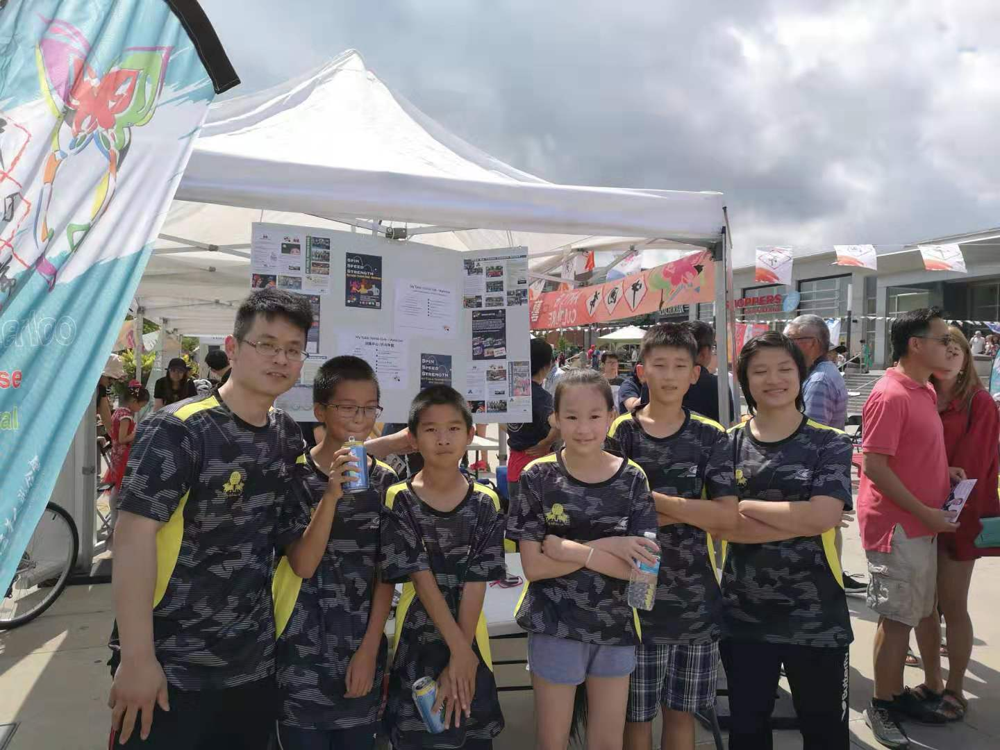


greedy_search: group of people are standing in front of large statue of

Beam search(width = 3): group of people are standing in front of statue


In [169]:
img_file =  "/content/drive/My Drive/ML-data/img2text/personal_test_image/WechatIMG35.jpeg"

inference(img_file)

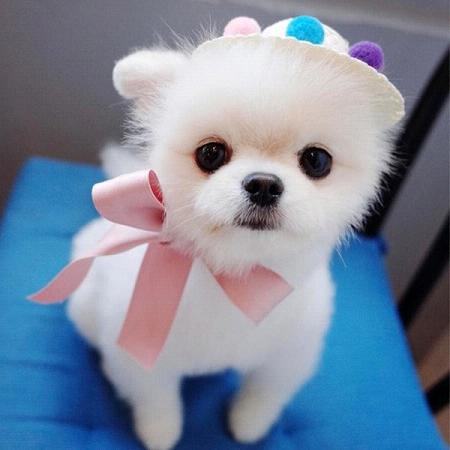


greedy_search: two small dogs are running through the grass

Beam search(width = 3): two small dogs are running through the grass


In [170]:
img_file =  "/content/drive/My Drive/ML-data/img2text/personal_test_image/1554274317-gWjtOnLlzq.jpg"

inference(img_file)